In [1]:
import numpy as np
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm

import torch
from torchvision import transforms, datasets
from torchvision import utils as vutils
from pytorch_lightning import seed_everything

from realNVP.realnvp import RealNVP
from realNVP.data_utils import logit_transform
from VAE.models import VAE
from GAN.models import GAN
from glow.utils import preprocess, postprocess
from glow.model import Glow

In [2]:
CHECKPOINTS = {
    "gan": "logs/gan/version_3/checkpoints/last.ckpt",
    "vae": "logs/vae/version_0/checkpoints/last.ckpt",
    "realnvp": "logs/realnvp/version_3/checkpoints/last.ckpt",
}

In [3]:
SEED = 43
seed_everything(SEED)

Global seed set to 43


43

In [4]:
common_transforms = transforms.Compose([
    transforms.CenterCrop(168),
    transforms.Resize(64),
    transforms.ToTensor(),
])
gan_transforms = transforms.Compose([
    common_transforms,
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])
glow_transforms = transforms.Compose([
    common_transforms,
    preprocess,
])

In [70]:
dataset = datasets.CelebA(root="data/", split="test", transform=common_transforms)
gan_dataset = datasets.CelebA(root="data/", split="test", transform=gan_transforms)
glow_dataset = datasets.CelebA(root="data/", split="test", transform=glow_transforms)

In [6]:
gan = GAN.load_from_checkpoint(CHECKPOINTS["gan"])
gan.eval();

In [7]:
vae = VAE.load_from_checkpoint(CHECKPOINTS["vae"], hidden_dims=None)
vae.eval();

In [8]:
realnvp = RealNVP.load_from_checkpoint(CHECKPOINTS["realnvp"])
realnvp.eval();

In [9]:
def fetch_indices(ind, dataset):
    imgs = []
    for idx in ind:
        imgs.append(dataset[idx][0])
    return torch.stack(imgs, dim=0)

In [10]:
def show(img, size=15):
    plt.figure(figsize=(size,size))
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')

In [11]:
n_imgs = 8
ind = np.random.randint(0, len(dataset), size=n_imgs)
data = fetch_indices(ind, dataset)

# Reconstruction

### VAE

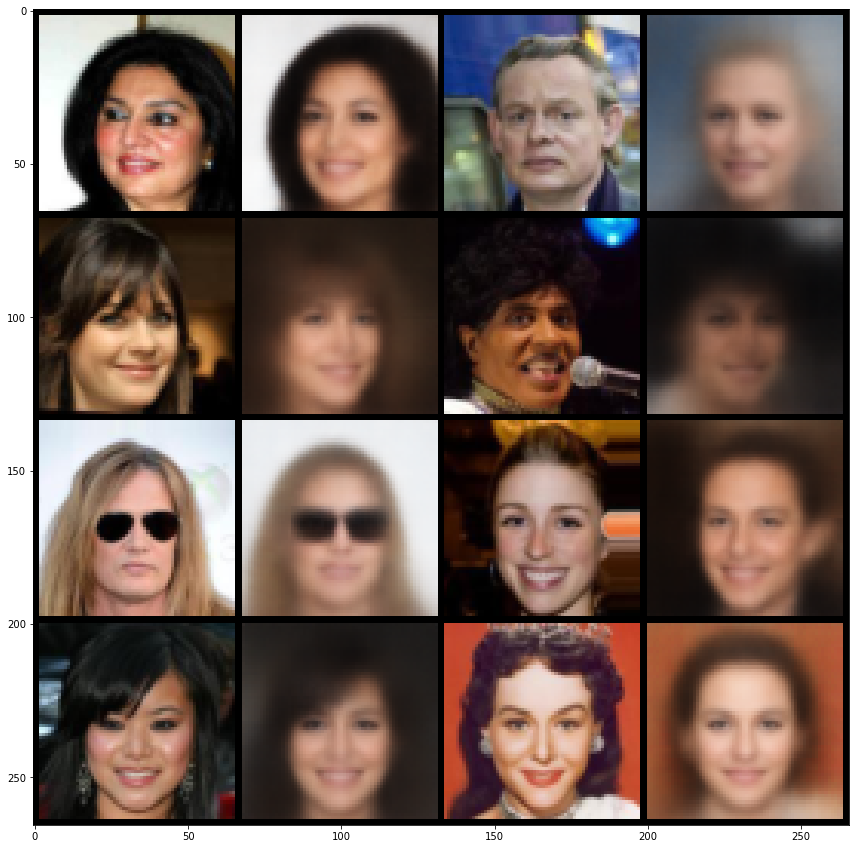

In [75]:
z, _ = vae.encode(data)
rec = vae.decode(z).detach()
paired_imgs = torch.stack((data, rec), dim=1).flatten(end_dim=1)
show(vutils.make_grid(paired_imgs, nrow=n_imgs//2))

### GAN

In [76]:
def find_gan_latent(x, maxiter=10000, lr=0.05, mask=None):
    latents = torch.randn(x.shape[0], gan.nz, 1, 1, requires_grad=True)
    optim = torch.optim.Adamax([latents], lr=lr)
    scheduler = torch.optim.lr_scheduler.StepLR(optim, int(maxiter*0.85), gamma=0.2)
    for i in range(maxiter):
        rec = gan(latents)
        if mask is None:
            dist = torch.sum((x - rec) ** 2, dim=(-1, -2, -3))
        else:
            dist = torch.sum(mask * (x - rec) ** 2, dim=(-1, -2, -3))
        loss = torch.mean(dist)
        
        if i % 200 == 0:
            print("Iter {}: min dist {:.3f}, avg dist {:.3f}, max dist {:.3f}".format(
                i+1, 
                torch.min(dist).item(),
                loss.item(), 
                torch.max(dist).item(),
            ))

        optim.zero_grad()
        loss.backward()
        optim.step()
        scheduler.step()
    return latents.detach()

In [77]:
gan_data = fetch_indices(ind, gan_dataset)
gan_latents = find_gan_latent(gan_data, maxiter=15000)

Iter 1: min dist 2438.063, avg dist 6365.685, max dist 12596.871
Iter 201: min dist 432.540, avg dist 698.111, max dist 869.592
Iter 401: min dist 379.603, avg dist 597.107, max dist 789.152
Iter 601: min dist 351.565, avg dist 543.829, max dist 708.746
Iter 801: min dist 337.254, avg dist 500.164, max dist 628.787
Iter 1001: min dist 326.788, avg dist 464.037, max dist 574.845
Iter 1201: min dist 317.193, avg dist 439.348, max dist 544.854
Iter 1401: min dist 280.772, avg dist 398.614, max dist 514.480
Iter 1601: min dist 255.755, avg dist 381.943, max dist 496.302
Iter 1801: min dist 243.884, avg dist 369.990, max dist 485.832
Iter 2001: min dist 235.577, avg dist 355.393, max dist 454.516
Iter 2201: min dist 225.475, avg dist 343.524, max dist 439.355
Iter 2401: min dist 218.636, avg dist 333.041, max dist 429.821
Iter 2601: min dist 212.873, avg dist 324.622, max dist 424.525
Iter 2801: min dist 210.119, avg dist 318.189, max dist 422.284
Iter 3001: min dist 205.062, avg dist 310.7

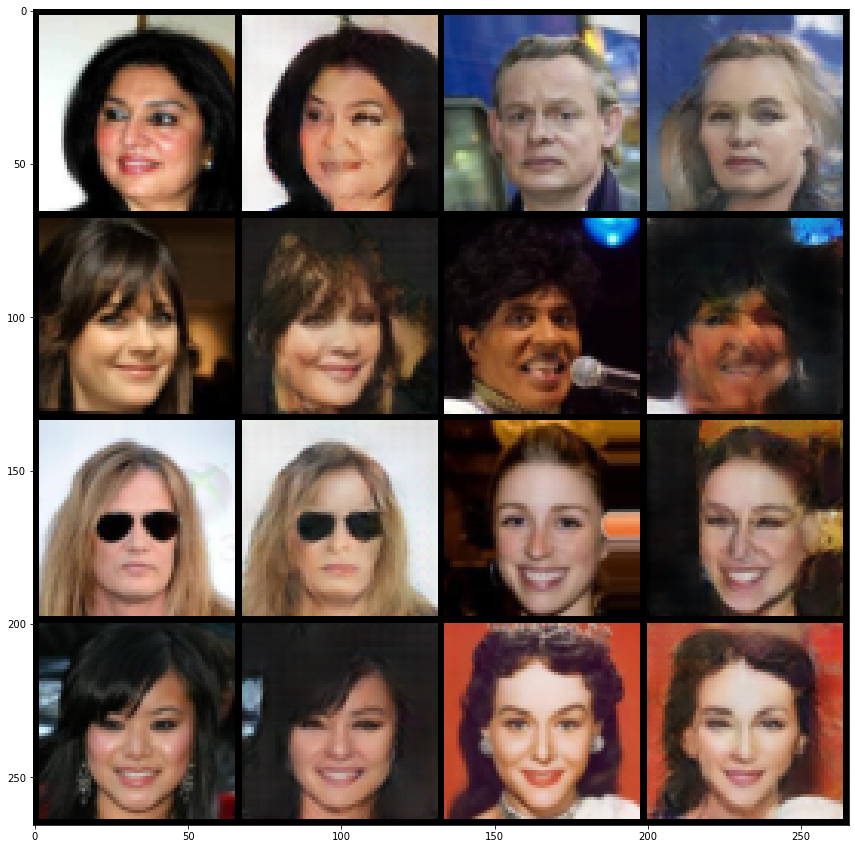

In [79]:
rec = (gan(gan_latents).detach() + 1) / 2
paired_imgs = torch.stack((data, rec), dim=1).flatten(end_dim=1)
show(vutils.make_grid(paired_imgs, nrow=n_imgs//2))
vutils.save_image(paired_imgs, "imgs/gan_rec.png", nrow=n_imgs//2)

# Sampling

### VAE

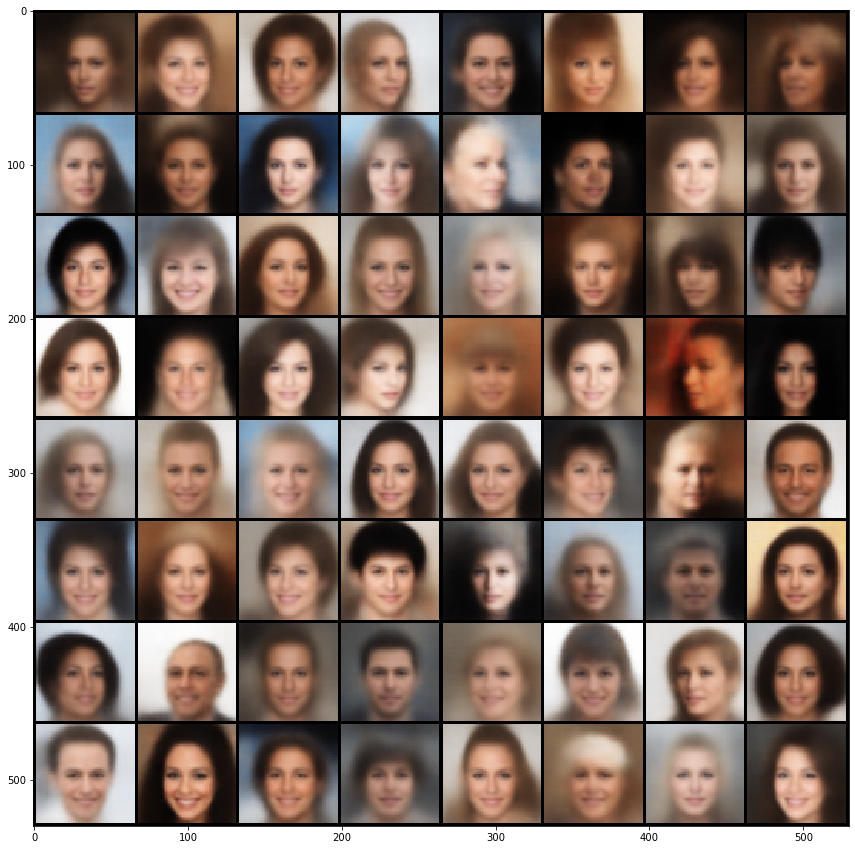

In [353]:
vae_samples = vae.sample(n_imgs**2).detach()
show(vutils.make_grid(vae_samples, nrow=n_imgs))

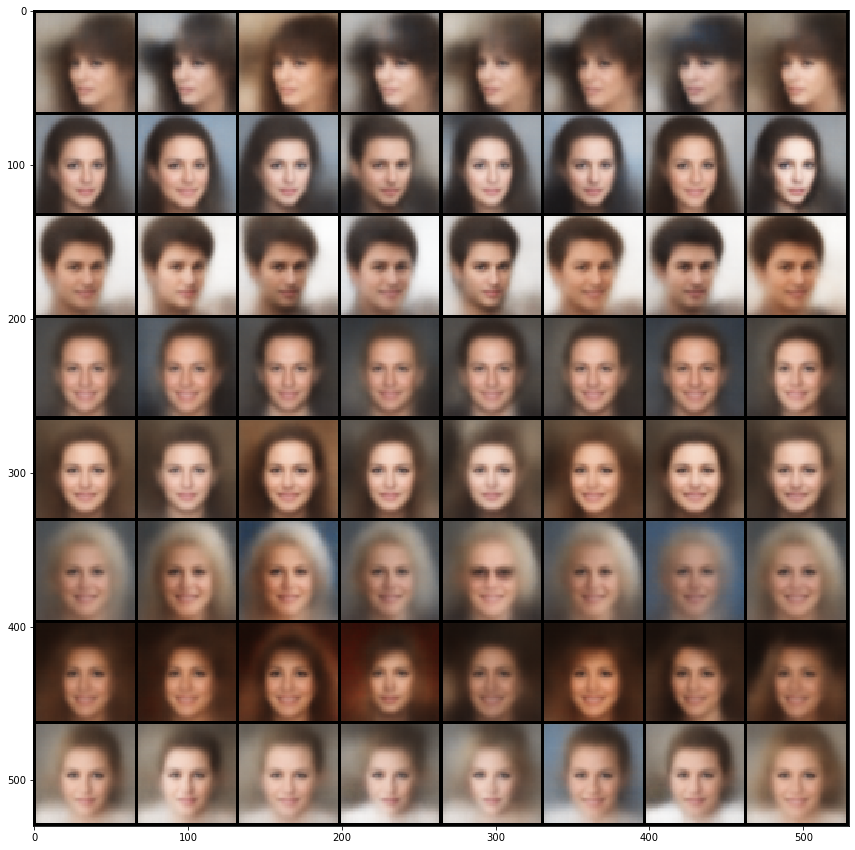

In [344]:
mu, logvar = vae.encode(data)
zs = [mu]
for i in range(n_imgs-1):
    z = vae.reparameterize(mu, logvar)
    zs.append(z)
zs = torch.stack(zs, dim=0).permute(1, 0, 2).flatten(end_dim=1)
rec = vae.decode(zs).detach()
show(vutils.make_grid(rec, nrow=n_imgs))

### GAN

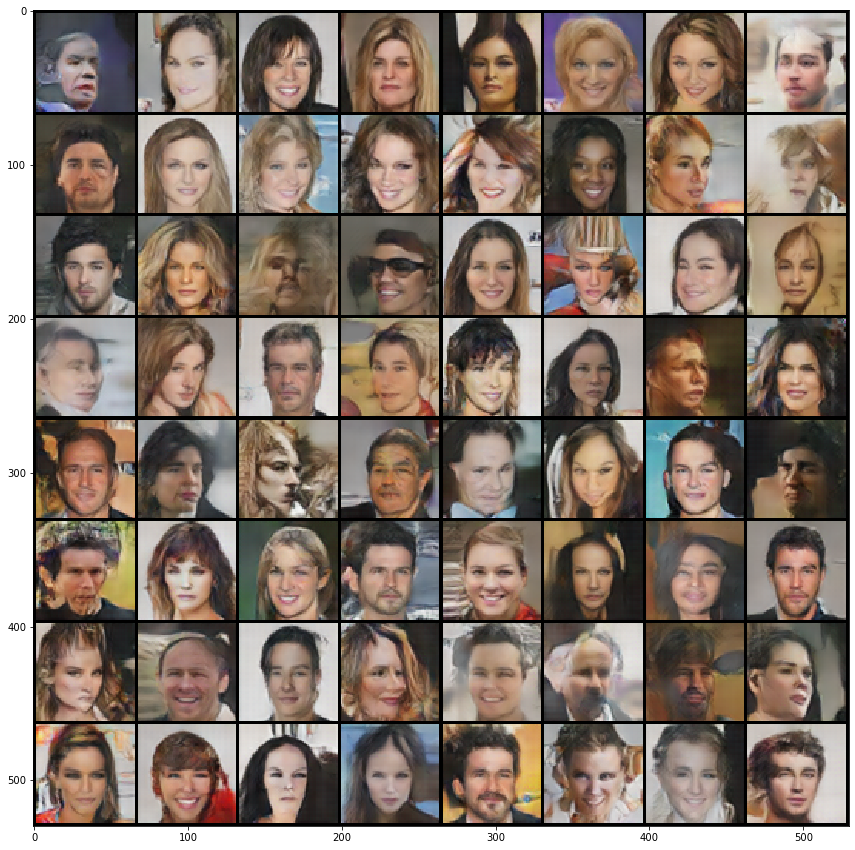

In [354]:
with torch.no_grad():
    gan_samples = gan.sample(n_imgs**2)
show(vutils.make_grid(gan_samples, nrow=n_imgs, normalize=True, range=(-1, 1)))

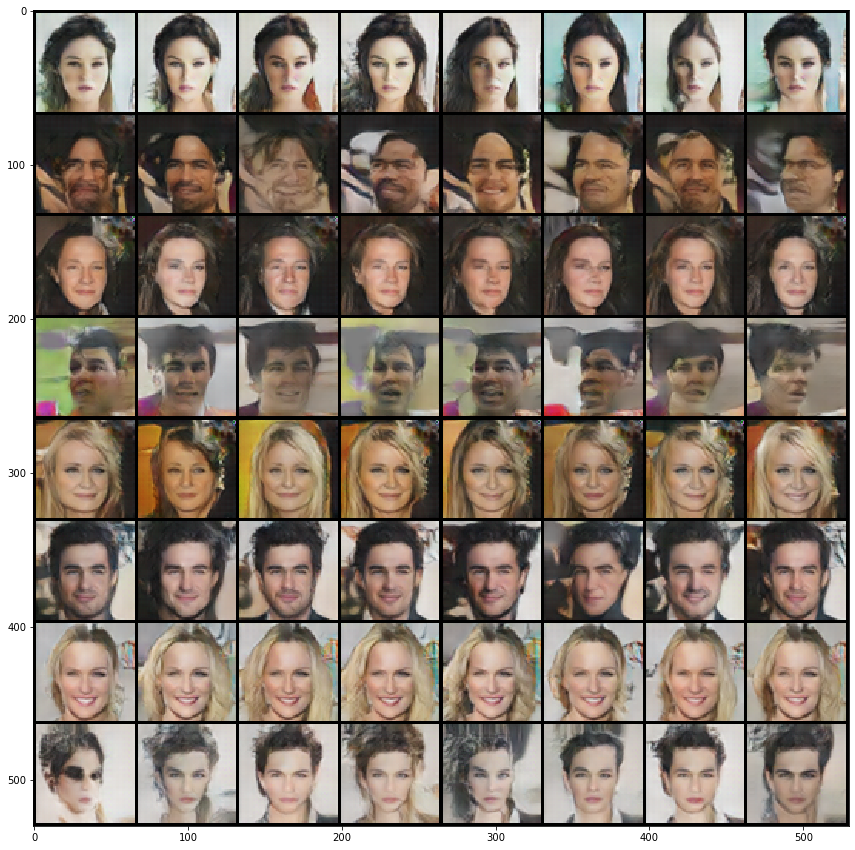

In [359]:
sigma = 0.4
z = torch.randn(n_imgs, 1, gan.nz, 1, 1)
noise = sigma * torch.randn(n_imgs, n_imgs, gan.nz, 1, 1)
zs = (z + noise).flatten(end_dim=1)
samples = gan(zs).detach()
show(vutils.make_grid(samples, nrow=n_imgs, normalize=True, range=(-1, 1)))

### RealNVP

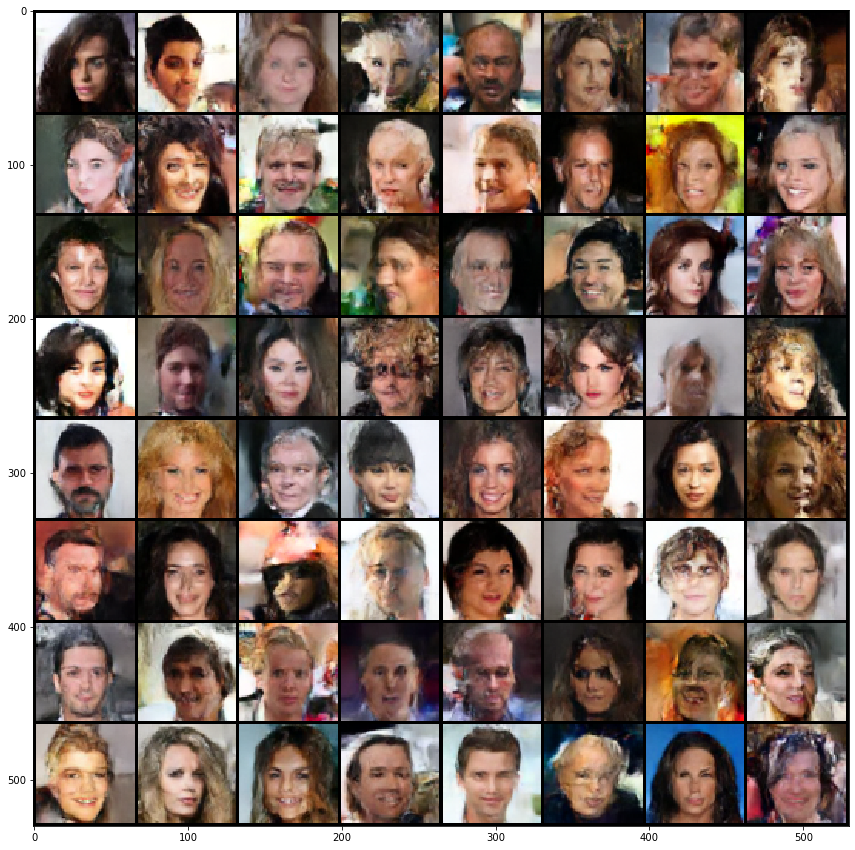

In [360]:
with torch.no_grad():
    realnvp_samples = realnvp.sample(n_imgs**2)
realnvp_samples, _ = logit_transform(realnvp_samples, reverse=True)
realnvp_samples = torch.clip(realnvp_samples, 0, 1)
show(vutils.make_grid(realnvp_samples, nrow=n_imgs))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


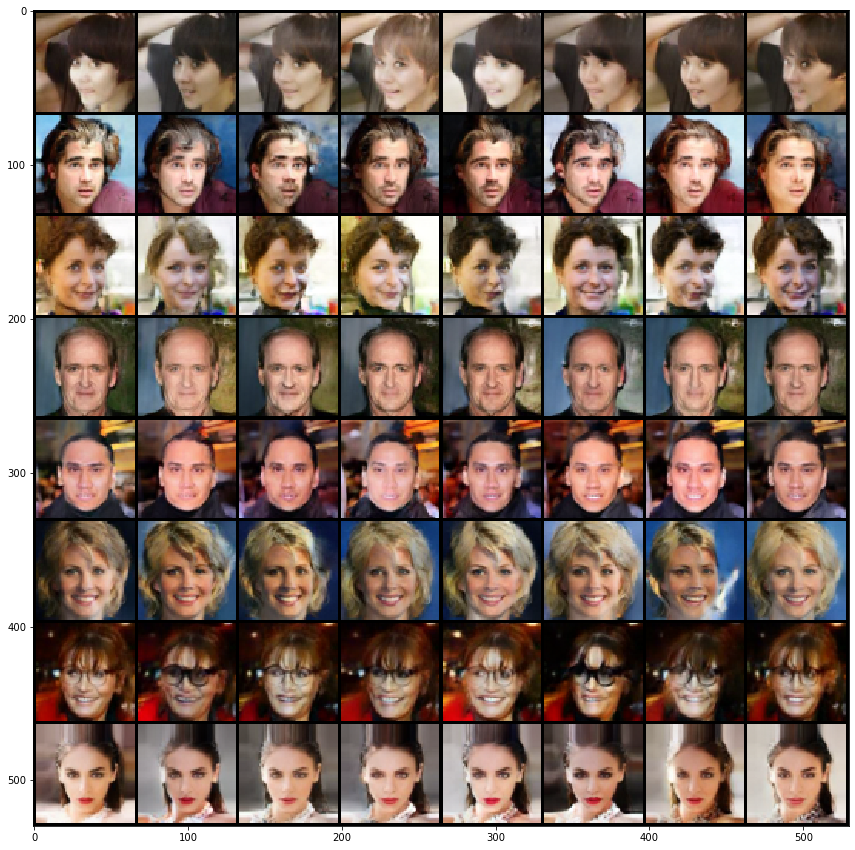

In [364]:
data_t, _ = logit_transform(data)
z, _ = realnvp.f(data_t)
z = z.unsqueeze(1)

sigma = 0.4
noise = sigma * torch.randn(n_imgs, n_imgs, z.shape[2], z.shape[3], z.shape[4])
zs = (z + noise).flatten(end_dim=1)
samples = realnvp.g(zs).detach()
samples, _ = logit_transform(samples, reverse=True)
sample = torch.clip(samples, 0, 1)

show(vutils.make_grid(samples, nrow=n_imgs))

# Interpolation

In [383]:
from_ind = ind
to_ind = np.random.randint(0, len(dataset), size=n_imgs)

### VAE

In [384]:
from_imgs = fetch_indices(from_ind, dataset)
to_imgs = fetch_indices(to_ind, dataset)

In [385]:
from_latents = vae.encode(from_imgs)[0]
to_latents = vae.encode(to_imgs)[0]

In [386]:
intermediate = []
for t in np.linspace(0, 1, n_imgs):
    latents = (1 - t) * from_latents + t * to_latents
    imgs = vae.decode(latents)
    intermediate.append(imgs)
intermediate = torch.stack(intermediate, dim=1).flatten(end_dim=1).detach()

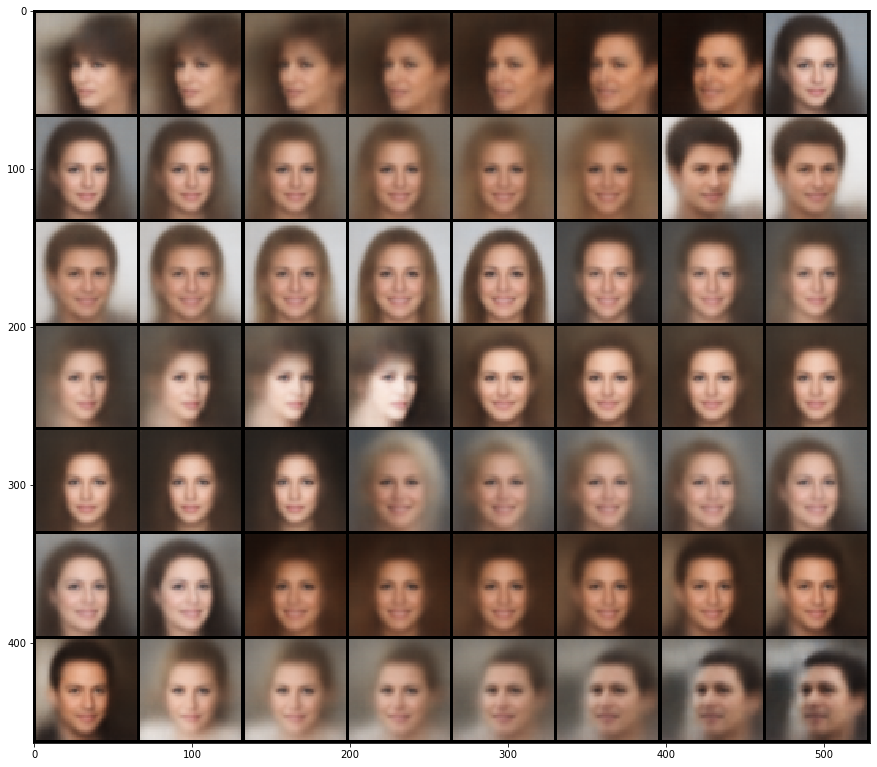

In [387]:
show(vutils.make_grid(intermediate, nrow=n_imgs))

### GAN

In [392]:
from_imgs = fetch_indices(from_ind, gan_dataset)
to_imgs = fetch_indices(to_ind, gan_dataset)

In [393]:
from_latents = find_gan_latent(from_imgs)
to_latents = find_gan_latent(to_imgs)

Iter 1: min dist 2765.095, avg dist 4697.410, max dist 8359.067
Iter 201: min dist 515.668, avg dist 776.385, max dist 1088.164
Iter 401: min dist 434.933, avg dist 628.284, max dist 925.641
Iter 601: min dist 387.607, avg dist 568.401, max dist 846.342
Iter 801: min dist 367.898, avg dist 538.937, max dist 818.551
Iter 1001: min dist 350.436, avg dist 511.154, max dist 778.682
Iter 1201: min dist 335.688, avg dist 486.443, max dist 734.029
Iter 1401: min dist 320.543, avg dist 459.136, max dist 653.509
Iter 1601: min dist 295.762, avg dist 437.220, max dist 621.455
Iter 1801: min dist 281.093, avg dist 423.337, max dist 594.953
Iter 2001: min dist 269.433, avg dist 413.286, max dist 579.848
Iter 2201: min dist 264.657, avg dist 405.867, max dist 567.287
Iter 2401: min dist 262.913, avg dist 400.186, max dist 558.146
Iter 2601: min dist 260.283, avg dist 395.175, max dist 552.185
Iter 2801: min dist 251.358, avg dist 390.591, max dist 547.388
Iter 3001: min dist 244.903, avg dist 387.3

In [394]:
intermediate = []
for t in np.linspace(0, 1, n_imgs):
    latents = (1 - t) * from_latents + t * to_latents
    imgs = gan(latents)
    intermediate.append(imgs)
intermediate = torch.stack(intermediate, dim=1).flatten(end_dim=1).detach()

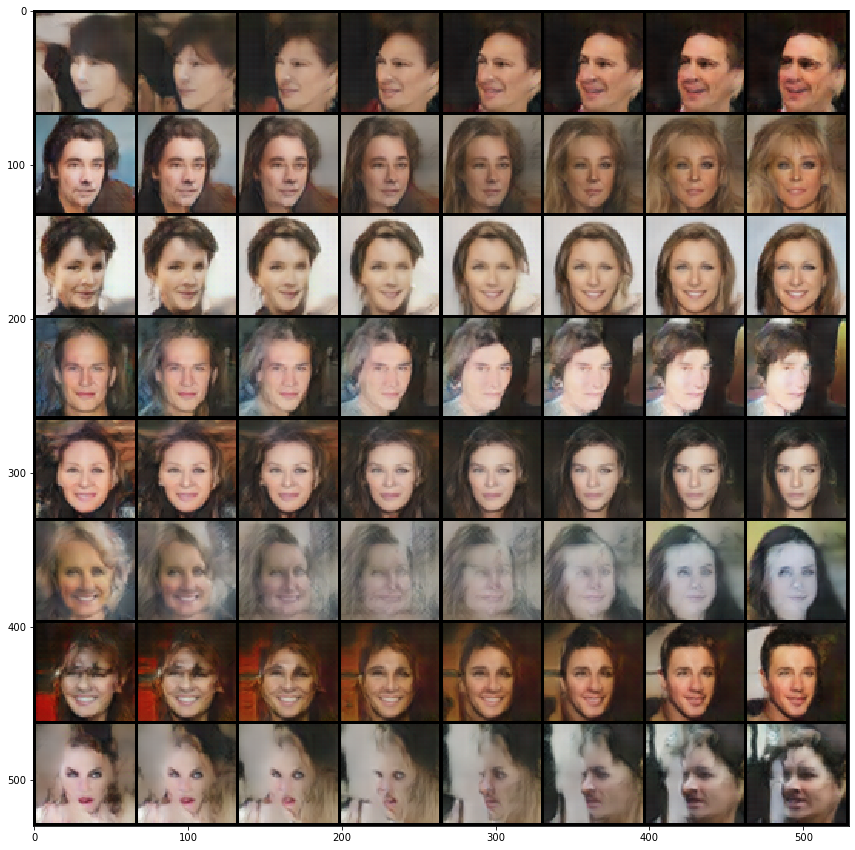

In [395]:
show(vutils.make_grid(intermediate, nrow=n_imgs, normalize=True, range=(-1, 1)))

### RealNVP

In [396]:
from_imgs = fetch_indices(from_ind, dataset)
from_imgs, _ = logit_transform(from_imgs)
to_imgs = fetch_indices(to_ind, dataset)
to_imgs, _ = logit_transform(to_imgs)

In [397]:
from_latents, _ = realnvp.f(from_imgs)
to_latents, _ = realnvp.f(to_imgs)

In [400]:
intermediate = []
for t in np.linspace(0, 1, n_imgs):
    latents = (1 - t) * from_latents + t * to_latents
    imgs = realnvp.g(latents)
    intermediate.append(imgs)
intermediate = torch.stack(intermediate, dim=1).flatten(end_dim=1).detach()
intermediate, _ = logit_transform(intermediate, reverse=True)
intermediate = torch.clip(intermediate, 0, 1)

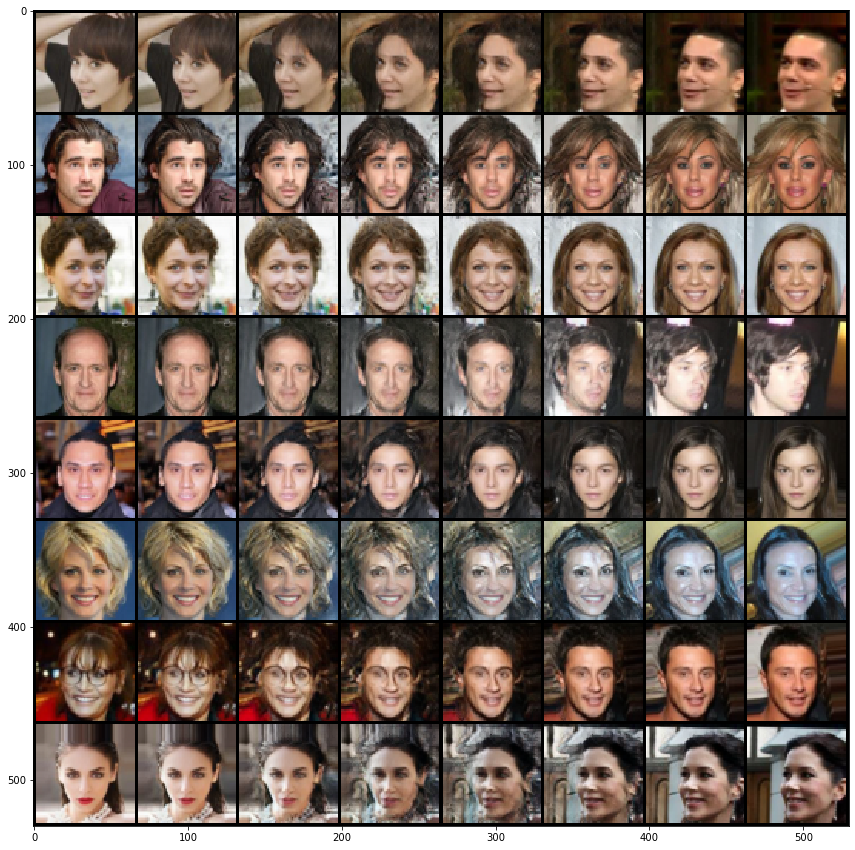

In [401]:
show(vutils.make_grid(intermediate, nrow=n_imgs))

# Arithmetics

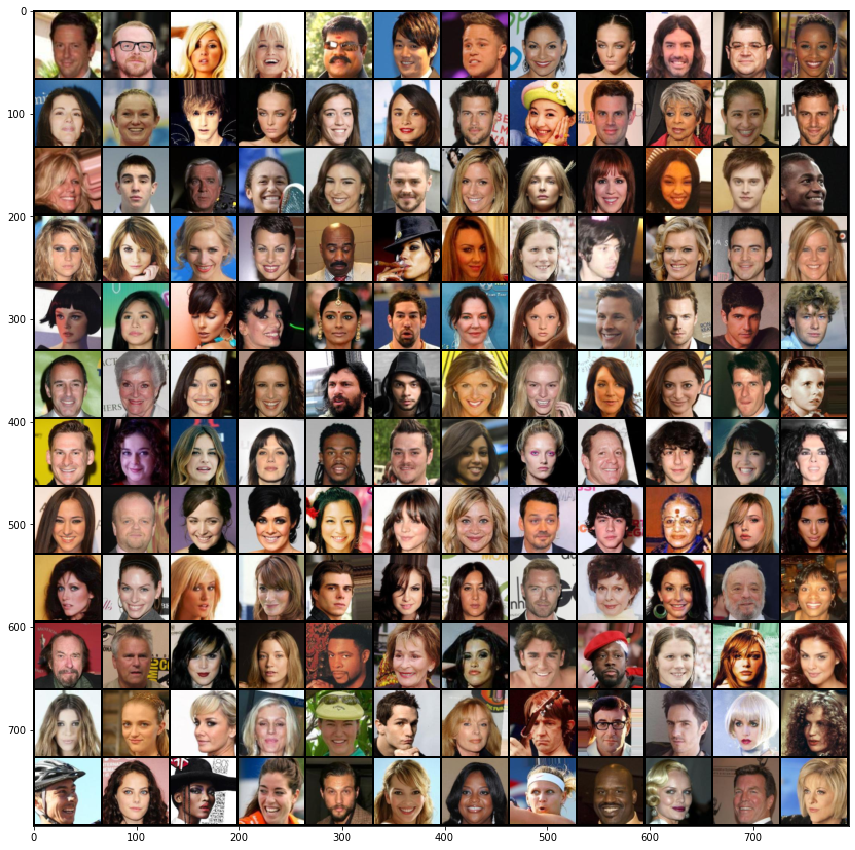

In [238]:
ind = np.random.randint(0, len(dataset), size=144)
data = fetch_indices(ind, dataset)
show(vutils.make_grid(data, nrow=12), size=15)

In [276]:
ind = [76, 75, 18]
arit_data = data[ind]

### VAE

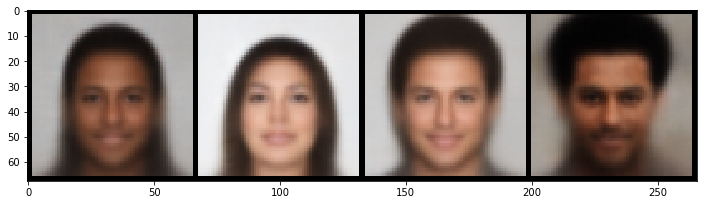

In [326]:
arit_z, _ = vae.encode(arit_data)
diff = arit_z[0] - arit_z[1]
new_z = arit_z[2] + diff
all_z = torch.cat((arit_z, new_z.unsqueeze(0)), dim=0)
rec = vae.decode(all_z).detach()
show(vutils.make_grid(rec, nrow=4), size=12)

### RealNVP

In [273]:
arit_data, _ = logit_transform(arit_data)
arit_z, _ = realnvp.f(arit_data)

diff = arit_z[0] - arit_z[1]
new_z = arit_z[2] + 0.7*diff

with torch.no_grad():
    sample = realnvp.g(new_z.unsqueeze(0))
sample, _ = logit_transform(sample, reverse=True)
sample = torch.clip(sample, 0, 1)

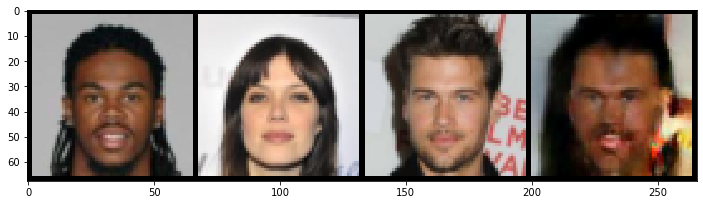

In [274]:
arit_samples = torch.cat((data[ind], sample), dim=0)
show(vutils.make_grid(arit_samples, nrow=4), size=12)

### GAN

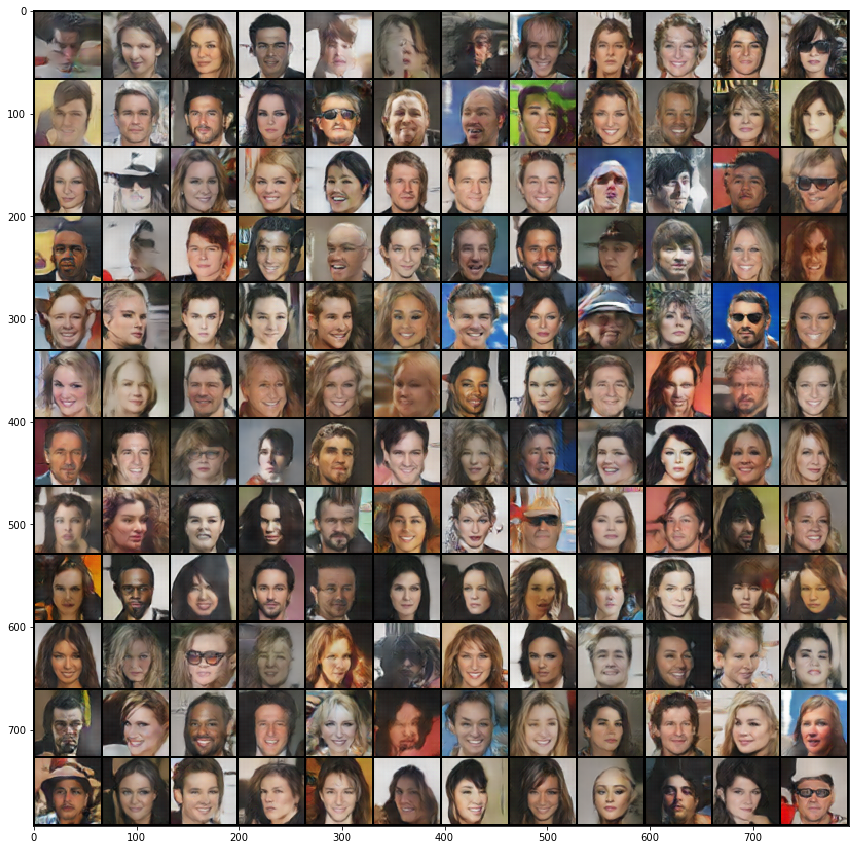

In [212]:
noise = torch.randn(144, gan.nz, 1, 1)
with torch.no_grad():
    samples = gan(noise)
show(vutils.make_grid(samples, nrow=12, normalize=True, range=(-1, 1)), size=15)

In [228]:
ind = [97, 73, 130]

arit_noise = noise[ind]
diff = arit_noise[0] - arit_noise[1]
new_noise = arit_noise[2] + diff

with torch.no_grad():
    sample = gan(new_noise.unsqueeze(0))

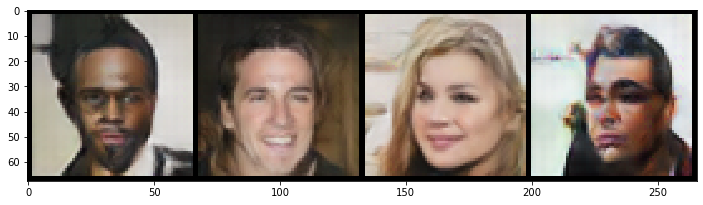

In [229]:
arit_samples = torch.cat((samples[ind], sample), dim=0)
show(vutils.make_grid(arit_samples, nrow=4, normalize=True, range=(-1, 1)), size=12)

# Attribute manipulation

In [12]:
attr = 16 # goatee
# attr = 22 # mustache
attr_ind = []
no_attr_ind = []
for i, (x, y) in enumerate(tqdm(dataset)):
    if y[attr] == 1:
        attr_ind.append(i)
    else:
        no_attr_ind.append(i)

In [13]:
attr_subind = np.random.randint(0, len(attr_ind), size=256)
attr_subset = np.array(attr_ind)[attr_subind]
attr_data = fetch_indices(attr_subset, dataset)

In [14]:
no_attr_subind = np.random.randint(0, len(no_attr_ind), size=256)
no_attr_subset = np.array(no_attr_ind)[no_attr_subind]
no_attr_data = fetch_indices(no_attr_subset, dataset)

### RealNVP

In [15]:
attr_data_t, _ = logit_transform(attr_data)
attr_z, _ = realnvp.f(attr_data_t)

In [16]:
attr_pos = torch.mean(attr_z, dim=0)

In [17]:
no_attr_data_t, _ = logit_transform(no_attr_data)
no_attr_z, _ = realnvp.f(no_attr_data_t)

In [18]:
attr_neg = torch.mean(no_attr_z, dim=0)
attr_diff = attr_pos - attr_neg

In [19]:
data_t, _ = logit_transform(data)
z, _ = realnvp.f(data_t)
rec = realnvp.g(z + 1.5*attr_diff)
rec, _ = logit_transform(rec, reverse=True)
rec = torch.clip(rec, 0, 1).detach()

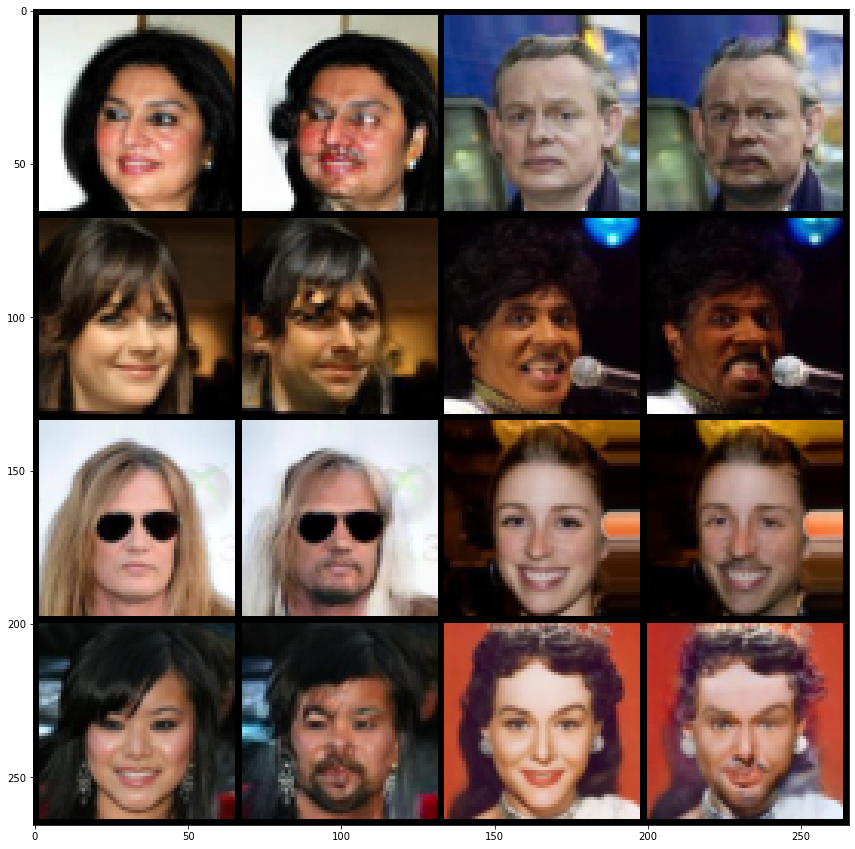

In [20]:
paired_imgs = torch.stack((data, rec), dim=1).flatten(end_dim=1)
show(vutils.make_grid(paired_imgs, nrow=4))

### VAE

In [21]:
attr_z, _ = vae.encode(attr_data)
attr_z = attr_z.detach()

In [22]:
no_attr_z, _ = vae.encode(no_attr_data)
no_attr_z = no_attr_z.detach()

In [23]:
attr_pos = torch.mean(attr_z, dim=0)
attr_neg = torch.mean(no_attr_z, dim=0)
attr_diff = attr_pos - attr_neg

In [28]:
z, _ = vae.encode(data)
rec = vae.decode(z).detach()
rec_attr = vae.decode(z + 1.5*attr_diff).detach()

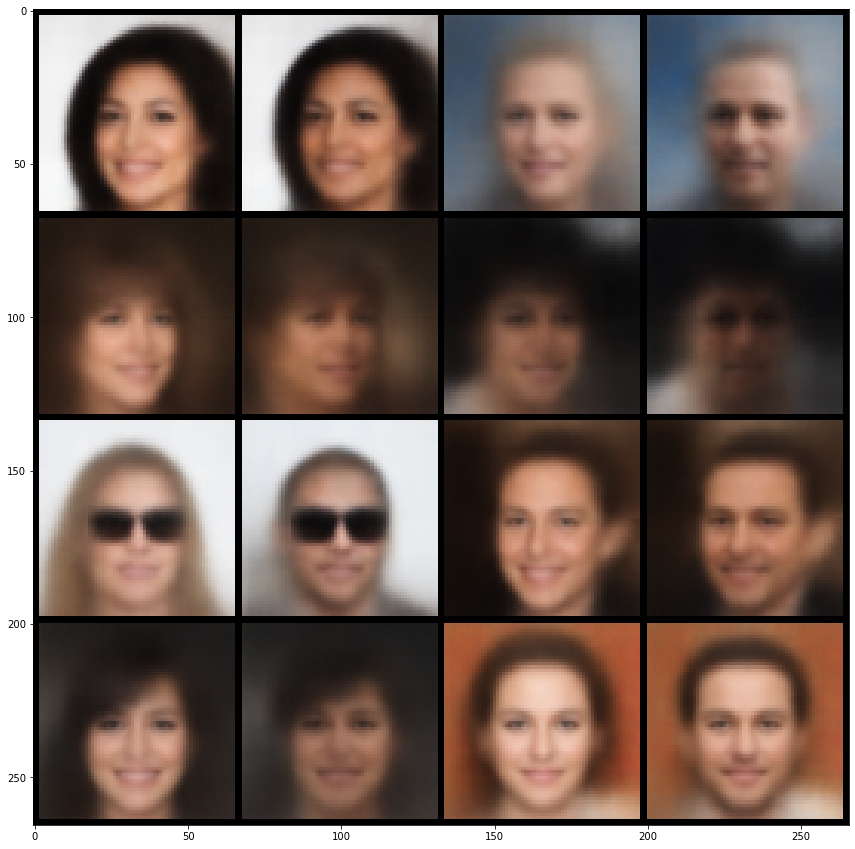

In [29]:
paired_imgs = torch.stack((rec, rec_attr), dim=1).flatten(end_dim=1)
show(vutils.make_grid(paired_imgs, nrow=4))

# Inpainting

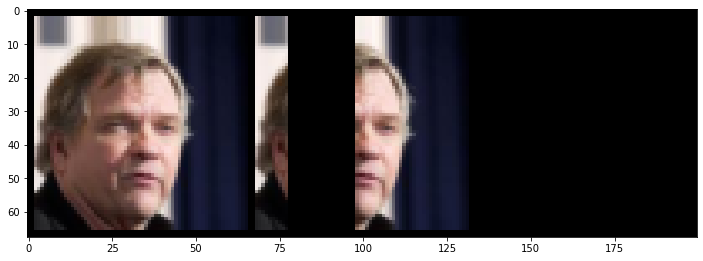

In [82]:
idx = 162
img, _ = dataset[idx]
mask = torch.ones_like(img)
mask[:, :, 10:30] = 0
masked = img * mask
zeros = torch.zeros_like(img)

both = torch.stack((img, masked, zeros), dim=0)
show(vutils.make_grid(both, nrow=3), size=12)

### RealNVP

In [31]:
with torch.no_grad():
    img_t, log_det_img = logit_transform(img.unsqueeze(0))
    log_prob_img = log_det_img + realnvp.log_prob(img_t)

    masked_t, log_det_masked = logit_transform(masked.unsqueeze(0))
    log_prob_masked = log_det_masked + realnvp.log_prob(masked_t)
log_prob_img.item(), log_prob_masked.item()

(46893.3515625, 50257.7265625)

### GAN

In [40]:
gan_img, _ = gan_dataset[idx]

In [41]:
latent = find_gan_latent(gan_img.unsqueeze(0), maxiter=15000, mask=mask)

Iter 1: min dist 4393.158, avg dist 4393.158, max dist 4393.158
Iter 201: min dist 497.232, avg dist 497.232, max dist 497.232
Iter 401: min dist 375.826, avg dist 375.826, max dist 375.826
Iter 601: min dist 345.592, avg dist 345.592, max dist 345.592
Iter 801: min dist 328.410, avg dist 328.410, max dist 328.410
Iter 1001: min dist 314.768, avg dist 314.768, max dist 314.768
Iter 1201: min dist 305.015, avg dist 305.015, max dist 305.015
Iter 1401: min dist 293.727, avg dist 293.727, max dist 293.727
Iter 1601: min dist 285.082, avg dist 285.082, max dist 285.082
Iter 1801: min dist 278.275, avg dist 278.275, max dist 278.275
Iter 2001: min dist 269.985, avg dist 269.985, max dist 269.985
Iter 2201: min dist 257.767, avg dist 257.767, max dist 257.767
Iter 2401: min dist 245.008, avg dist 245.008, max dist 245.008
Iter 2601: min dist 237.849, avg dist 237.849, max dist 237.849
Iter 2801: min dist 234.524, avg dist 234.524, max dist 234.524
Iter 3001: min dist 232.159, avg dist 232.15

In [42]:
with torch.no_grad():
    reconstructed = gan(latent)[0]
reconstructed = (reconstructed + 1) / 2

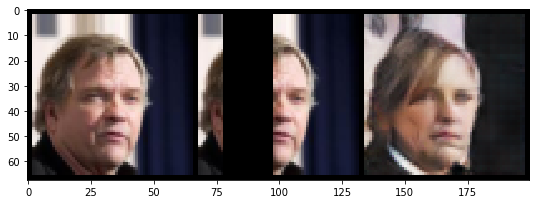

In [43]:
all_img = torch.stack((img, masked, reconstructed), dim=0)
show(vutils.make_grid(all_img, nrow=3), size=9)

### VAE

In [44]:
with torch.no_grad():
    rec, mu, logvar = vae(masked.unsqueeze(0))

In [45]:
vae.loss_function(masked.unsqueeze(0), rec, mu, logvar)

{'loss': tensor(0.4103), 'rec_loss': tensor(0.3749), 'kl': tensor(35.4506)}

In [46]:
with torch.no_grad():
    rec, mu, logvar = vae(img.unsqueeze(0))
vae.loss_function(img.unsqueeze(0), rec, mu, logvar)

{'loss': tensor(0.5246), 'rec_loss': tensor(0.4960), 'kl': tensor(28.5928)}

# Denoising

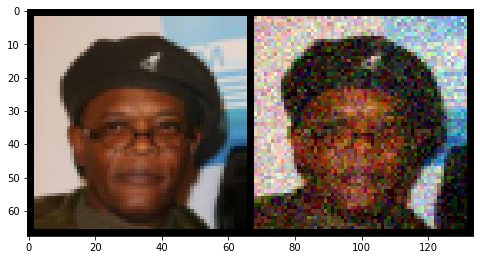

In [47]:
idx = 51
img, _ = dataset[idx]

sigma = 0.1
noise = sigma * torch.randn_like(img)
noisy = torch.clip(img + noise, 0, 1)

both = torch.stack((img, noisy), dim=0)
show(vutils.make_grid(both, nrow=2), size=8)

### RealNVP

In [49]:
with torch.no_grad():
    img_t, log_det_img = logit_transform(img.unsqueeze(0))
    log_prob_img = log_det_img + realnvp.log_prob(img_t)

    noisy_t, log_det_noisy = logit_transform(noisy.unsqueeze(0))
    log_prob_noisy = log_det_noisy + realnvp.log_prob(noisy_t)
log_prob_img.item(), log_prob_noisy.item()

(44405.01171875, -24742.845703125)

In [50]:
def denoise(img, lbd=0.01, maxiter=300):
    x = img.clone()
    x.requires_grad = True
    optim = torch.optim.Adamax([x], lr=0.01)
    for i in range(maxiter):
        x_t, log_det = logit_transform(x.unsqueeze(0))
        log_prob = log_det + realnvp.log_prob(x_t)
        dist = torch.sum((x - img) ** 2)
        loss = dist - lbd * log_prob
        
        if i % 5 == 0:
            print("Iter {}: dist {:.3f}, log prob {:.3f}, loss {:.3f}".format(
                i+1, 
                dist.item(), 
                log_prob.item(), 
                loss.item()
            ))
        
        optim.zero_grad()
        loss.backward()
        optim.step()
    return x

In [52]:
denoised = denoise(noisy)

Iter 1: dist 0.000, log prob -24767.516, loss 247.675
Iter 6: dist 11.067, log prob 4894.051, loss -37.874
Iter 11: dist 21.514, log prob 10550.440, loss -83.990
Iter 16: dist 27.743, log prob 13585.048, loss -108.107
Iter 21: dist 31.209, log prob 15623.728, loss -125.028
Iter 26: dist 33.442, log prob 17198.775, loss -138.546
Iter 31: dist 35.448, log prob 18529.457, loss -149.846
Iter 36: dist 37.677, log prob 19810.740, loss -160.431
Iter 41: dist 40.426, log prob 21103.389, loss -170.607
Iter 46: dist 43.597, log prob 22429.312, loss -180.696
Iter 51: dist 47.053, log prob 23808.270, loss -191.030
Iter 56: dist 50.664, log prob 25266.426, loss -202.000
Iter 61: dist 54.203, log prob 26733.109, loss -213.128
Iter 66: dist 57.696, log prob 28228.027, loss -224.584
Iter 71: dist 60.930, log prob 29587.645, loss -234.946
Iter 76: dist 63.701, log prob 30830.031, loss -244.600
Iter 81: dist 66.331, log prob 32026.516, loss -253.934
Iter 86: dist 68.606, log prob 33009.906, loss -261.49

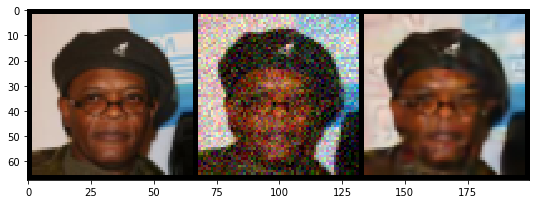

In [53]:
all_img = torch.stack((img, noisy, denoised.detach()), dim=0)
show(vutils.make_grid(all_img, nrow=3), size=9)

### GAN

In [54]:
gan_img, _ = gan_dataset[idx]

In [55]:
latent = find_gan_latent(gan_img.unsqueeze(0), maxiter=15000)

Iter 1: min dist 3959.580, avg dist 3959.580, max dist 3959.580
Iter 201: min dist 923.657, avg dist 923.657, max dist 923.657
Iter 401: min dist 795.997, avg dist 795.997, max dist 795.997
Iter 601: min dist 694.476, avg dist 694.476, max dist 694.476
Iter 801: min dist 628.012, avg dist 628.012, max dist 628.012
Iter 1001: min dist 585.848, avg dist 585.848, max dist 585.848
Iter 1201: min dist 554.504, avg dist 554.504, max dist 554.504
Iter 1401: min dist 512.907, avg dist 512.907, max dist 512.907
Iter 1601: min dist 490.444, avg dist 490.444, max dist 490.444
Iter 1801: min dist 464.637, avg dist 464.637, max dist 464.637
Iter 2001: min dist 456.017, avg dist 456.017, max dist 456.017
Iter 2201: min dist 451.097, avg dist 451.097, max dist 451.097
Iter 2401: min dist 445.604, avg dist 445.604, max dist 445.604
Iter 2601: min dist 433.682, avg dist 433.682, max dist 433.682
Iter 2801: min dist 411.938, avg dist 411.938, max dist 411.938
Iter 3001: min dist 401.097, avg dist 401.09

In [58]:
with torch.no_grad():
    denoised = gan(latent)[0]
denoised = (denoised + 1) / 2

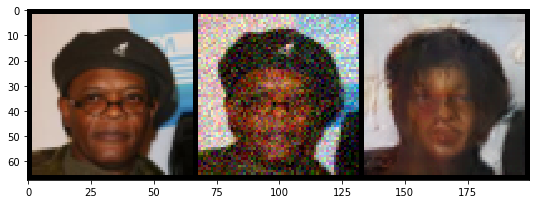

In [59]:
all_img = torch.stack((img, noisy, denoised), dim=0)
show(vutils.make_grid(all_img, nrow=3), size=9)

### VAE

In [60]:
rec, mu, logvar = vae(noisy.unsqueeze(0))

In [61]:
vae.loss_function(noisy.unsqueeze(0), rec, mu, logvar)

{'loss': tensor(0.5552, grad_fn=<AddBackward0>),
 'rec_loss': tensor(0.5283, grad_fn=<BinaryCrossEntropyBackward>),
 'kl': tensor(26.8547, grad_fn=<MeanBackward1>)}

In [62]:
rec, mu, logvar = vae(img.unsqueeze(0))
vae.loss_function(img.unsqueeze(0), rec, mu, logvar)

{'loss': tensor(0.5569, grad_fn=<AddBackward0>),
 'rec_loss': tensor(0.5292, grad_fn=<BinaryCrossEntropyBackward>),
 'kl': tensor(27.7224, grad_fn=<MeanBackward1>)}

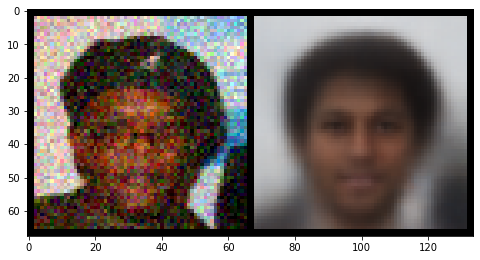

In [64]:
rec, _, _ = vae(noisy.unsqueeze(0))
rec = rec.detach()[0]

both = torch.stack((noisy, rec), dim=0)
show(vutils.make_grid(both, nrow=2), size=8)